In [1]:
from PIL import Image, ImageDraw, ImageFont

import numpy as np
import os
import json
import imagesize
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import traceback
import sys
!pip install face_recognition 
import face_recognition
%matplotlib inline
sns.set_style()

# to divide our data into train and validation set
from sklearn.model_selection import train_test_split
#to encode our labels
from tensorflow.keras.utils import to_categorical
#to build our model 
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Conv2D,MaxPool2D,Flatten,Dropout
# Our optimizer options
from keras.optimizers import RMSprop
from keras.optimizers import Adam
#Callback options
from tensorflow.keras.callbacks import EarlyStopping
from keras.callbacks import ReduceLROnPlateau
#importing image data generator for data augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
#for the final prediction report
from sklearn.metrics import classification_report ,confusion_matrix
from keras.applications.resnet50 import ResNet50
from tensorflow.keras.callbacks import ModelCheckpoint
from keras.applications.inception_v3 import InceptionV3
from keras.applications.vgg16 import VGG16
from tensorflow.keras.models import save_model, load_model

     |████████████████████████████████| 100.1 MB 26 kB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566172 sha256=6d7be7b884251311ac8a500f6dd1e6167e45366d69ddd3447c180aba3a4140b1
  Stored in directory: /root/.cache/pip/wheels/d6/81/3c/884bcd5e1c120ff548d57c2ecc9ebf3281c9a6f7c0e7e7947a
Successfully built face-recognition-models
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [2]:
# model = VGG16(weights=None, input_shape=input_shape, classes=len(categories))
# model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
# Load the model
filepath = '../input/image-classification/vgg16'
model = load_model(filepath, compile = True)

In [3]:
def get_cropped_image(img, bbox):
    start_x, start_y, width, height = bbox
    cropped_img = img[start_y:start_y+height, start_x:start_x+width]
    return cropped_img
      
def get_reshaped_image(img, new_shape=(224,224)):
    resized_image = cv2.resize(img, new_shape, interpolation = cv2.INTER_NEAREST) 
    return resized_image

def rescale_bbox(bbox, current_img_shape, new_img_shape=(224,224)):
    x_ratio = new_img_shape[0] / current_img_shape[0]
    y_ratio = new_img_shape[1] / current_img_shape[1]
    
    new_x = bbox[0] * x_ratio
    new_y = bbox[1] * y_ratio
    new_width = bbox[2] * x_ratio
    new_height = bbox[3] * y_ratio
    
    return new_x, new_y, new_width, new_height

def get_body_bbox(w,h, left,top,right,bottom):
    face_mid = (left+right)//2
    w_half = w//2
    
    start_x = int(face_mid - w_half)
    end_x = int(face_mid + w_half)
    
    start_y = int(bottom)
    end_y = int(h)
    
    return start_x, start_y, end_x-start_x, end_y

In [4]:
default_width = 35
default_height = 90 #58

current_shape = (0,0,default_width, default_height)

categories = ['tops', 'trousers', 'outerwear', 'dresses', 'skirts', 'noise']
colors = ["red", "green", "blue", "pink"]

fnt = ImageFont.truetype(r"../input/calibrifont/CALIBRI.TTF", 25)


def get_sub_images(img):
    sub_images = [img]
    half_h = img.shape[1] // 2    
    
    img2 = get_cropped_image(img,(0,0,img.shape[0], half_h))
    img3 = get_cropped_image(img,(0,half_h,img.shape[0], half_h))
    
    sub_images.append(img2)
    sub_images.append(img3)
    
    return sub_images

def draw_bbox(img_draw, bbox, cat, color="red"):
    # create rectangle box 
    x, y, w, h = bbox  
    img_draw.rectangle(((x, y),(x+w, y+h)),  outline =color, width=5) 
    img_draw.text((x, y-35), cat, font=fnt, fill=(255,255,255,128))
    
    return img_draw

def is_prediction_valid(category, sub_img_no):
    """
    Checks whether predicted category makes sense or not.
    For example, trouser can't be exact below face.
    Returns boolean value.
    """
    
    if sub_img_no == 0:
        return category == 'dresses' or category == 'tops'
    elif sub_img_no == 1:
        return category == 'tops' or category == 'outwear' 
    elif sub_img_no == 2:
        return category == 'trousers' or category == 'skirts'

def predict(images):
    """
    Uses image classifier to predict the class of the given image. 
    Returns string value of category.
    """
    predictions = model.predict(images)
#     print(predictions)
    
    predictions_cat = []
    
    for pred in predictions:
        pred = list(pred)
        index = pred.index(max(pred))
        predictions_cat.append(categories[index])
        
        
#     if predictions_cat[1] == 'tops' and predictions_cat[2] == 'trousers':
#         if predictions_cat[0] == 'dresses':
#             del predictions_cat[0]
    
    print(predictions_cat)
    
    return predictions_cat


def detect_objects(image_path, display_bbox=False):
    """
        Performs object detection and returns dictionary with below details.
        {{'tops':[[bbox1, bbox2,....]}, {'trousers':[[bbox1, bbox2,....]}}
        
        Only detected objects will be returned.
        
        If you want to disply bounding boxes around objects, pass display_bbox=True.
    """
    
    image = face_recognition.load_image_file(image_path)
    face_locations = face_recognition.face_locations(image)
    
    output = {}
    
    for fl in face_locations:
        try:
            top, right, bottom, left = fl

            img = Image.open(image_path)
            img2 = np.asarray(img)

            bbox = current_shape
            
            # Upward Scaling: we are scaling default body bbox to as per image size.
            x,y,w,h = rescale_bbox(bbox, (128,128), new_img_shape=(img2.shape[0],img2.shape[1]))

            actual_w = int(w)
            actual_h = int(h)
            
            bbox = get_body_bbox(w,h, left,top,right,bottom)
            
            start_x = bbox[0]
            start_y = bbox[1]
            
            img3 = get_cropped_image(img2, bbox)
            sub_images = get_sub_images(img3)
            
            sub_images_2 = [get_reshaped_image(img, new_shape=(128,128)) for img in sub_images]
            
            arr = np.asarray(sub_images_2)
            predictions = predict(arr)
            
            for i, category in enumerate(predictions):
                if is_prediction_valid(category, i):
                    if i == 0:
                        bbox = (start_x,start_y,actual_w,actual_h)
                    elif i == 1:
                        bbox = (start_x,start_y,actual_w,actual_h//2)
                    elif i == 2:
                        bbox = (start_x,start_y+actual_h//2,actual_w,actual_h//2)

                    if category in output:
                        output[category].append(bbox)
                    else:
                        output[category] = [bbox]
        except:
            print("ERROR:", image_path)
            traceback.print_exc()

    print("Final Output:", output)
            
    count = 0

    if display_bbox and len(output) > 0:
        img = Image.open(image_path)
        img_draw = ImageDraw.Draw(img)   
        
        for cat, boxes in output.items():
            for bbox in boxes:
                img_draw = draw_bbox(img_draw,bbox,cat, colors[count])
                count+=1
                
        display(img)    


['trousers', 'trousers', 'trousers']
['dresses', 'skirts', 'trousers']
Final Output: {'trousers': [(245, 354, 175, 225), (166, 407, 175, 225)], 'dresses': [(166, 182, 175, 450)]}


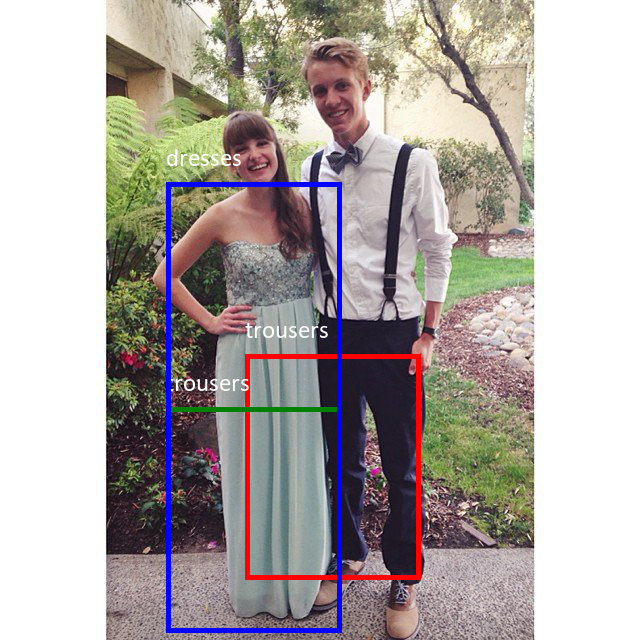

In [5]:
# output = detect_objects('../input/til2020/val/val/414.jpg', display_bbox=True)
output = detect_objects('../input/til2020/val/val/419.jpg', display_bbox=True)

['tops', 'outerwear', 'trousers']
Final Output: {'tops': [(486, 469, 646, 1247)], 'trousers': [(486, 1092, 646, 623)]}


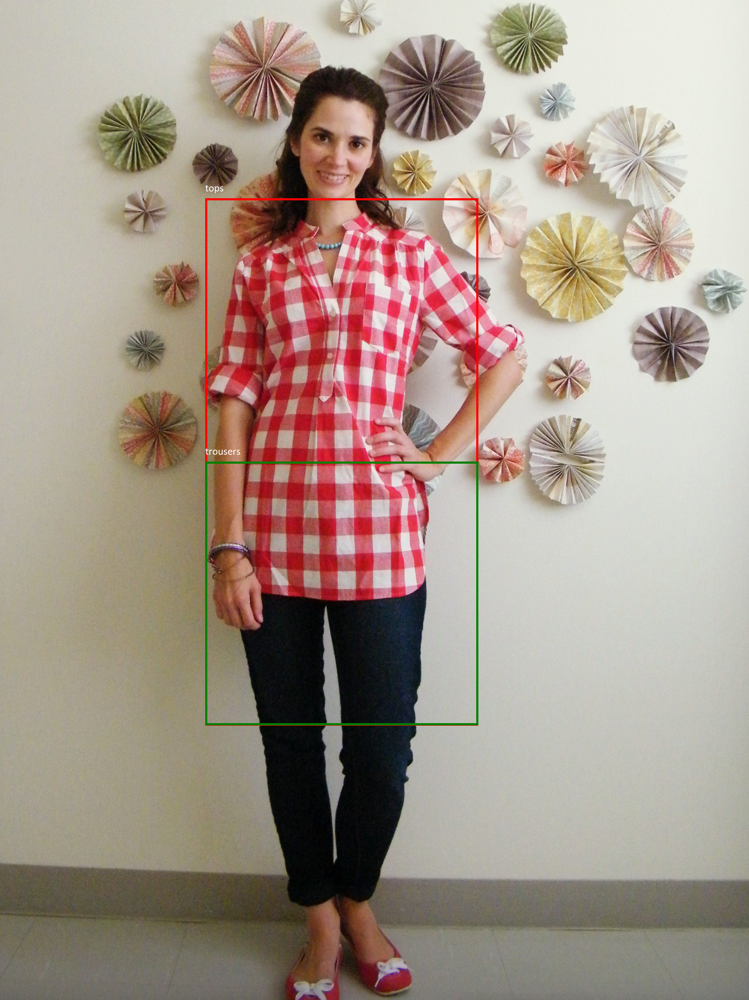

In [6]:
detect_objects('../input/til2020/val/val/414.jpg', display_bbox=True)

['dresses', 'trousers', 'trousers']
Final Output: {'dresses': [(165, 115, 211, 386)], 'trousers': [(165, 308, 211, 193)]}


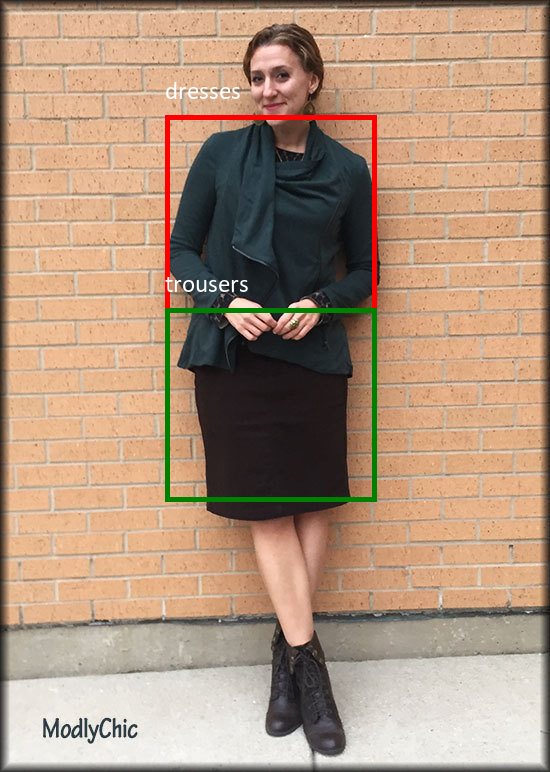

In [7]:
# Failed Case
detect_objects('../input/til2020/val/val/447.jpg', display_bbox=True)

['dresses', 'skirts', 'dresses']
Final Output: {'dresses': [(194, 196, 250, 428)]}


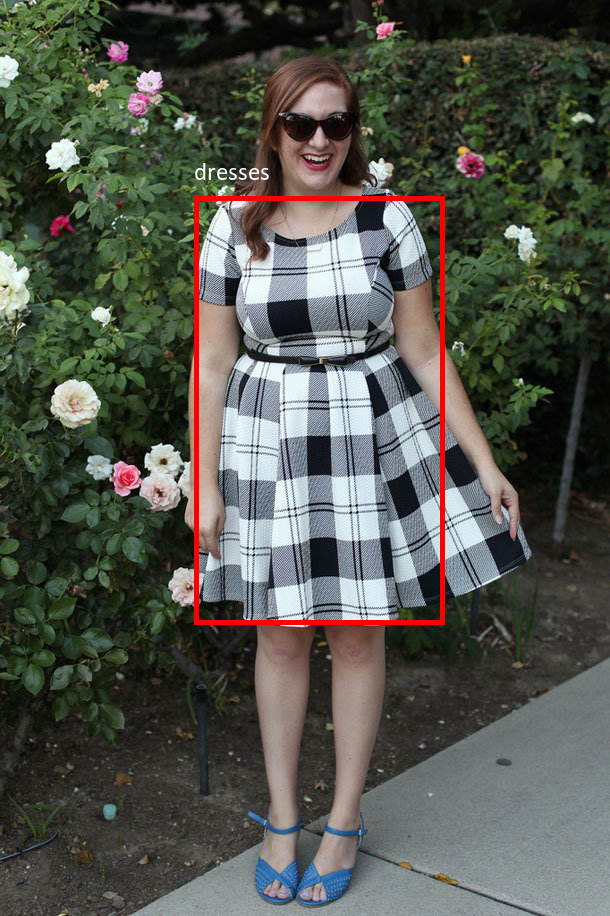

In [8]:
detect_objects('../input/til2020/val/val/724.jpg', display_bbox=True)

['dresses', 'outerwear', 'outerwear']
Final Output: {'dresses': [(129, 130, 180, 324)]}


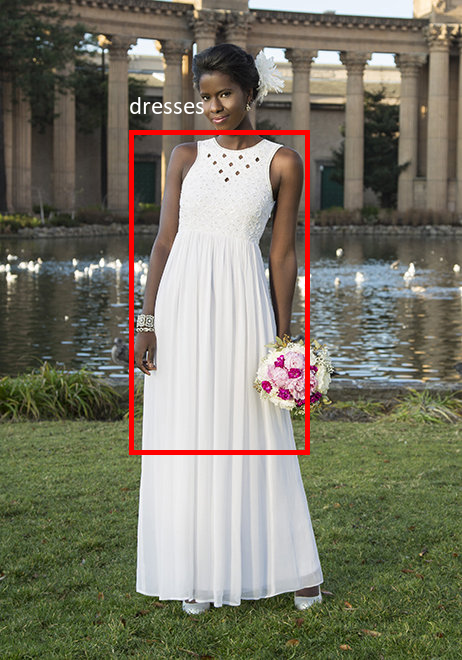

In [9]:
detect_objects('../input/til2020/val/val/804.jpg', display_bbox=True)